In [39]:
from gcVoronoi import *

import geopandas as gpd
import pandas as pd
import os
from shapely import geometry
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar

import contextily as cx

Data Sources

Senegal healthsites - https://healthsites.io/map?country=Senegal

Senegal population - https://hub.worldpop.org/geodata/summary?id=38701 Unconstrained 1kmx1km UN Adjusted

Senegal administrative border - https://data.humdata.org/dataset/cod-ab-sen (Level 0 = Senegal's border, Level 1 = Regional borders within)

## Voronoi Tessellation

In [2]:
gdf = gpd.read_file(os.path.join('Senegal healthsites', 'Senegal-node.shp'))
hosps = gdf[(gdf['amenity'] == 'hospital' )|( gdf['amenity'] == 'clinic')].drop_duplicates(subset='geometry', keep='first') # this now includes clinics
boundary = gpd.read_file(os.path.join('Senegal border level 0', 'sen_admbnda_adm0_anat_20240520.shp'))

In [3]:
subnat_boundary = gpd.read_file(os.path.join('Senegal border level 1', 'sen_admbnda_adm1_anat_20240520.shp'))
subnat_boundary.head()

,ADM1_FR,ADM1_PCODE,ADM1_REF,ADM0_FR,ADM0_PCODE,date,validOn,validTo,AREA_SQKM,Shape_Leng,Shape_Area,geometry
0,Dakar,SN01,None,Senegal,SN,2024-04-04,2024-05-20,None,541.651348,1.745858,0.045466,"MULTIPOLYGON (((-17.47205 14.65172, -17.47206 ..."
1,Diourbel,SN02,None,Senegal,SN,2024-04-04,2024-05-20,None,4861.766170,3.399877,0.408135,"POLYGON ((-16.22838 14.95410, -16.22358 14.952..."
2,Fatick,SN03,None,Senegal,SN,2024-04-04,2024-05-20,None,7011.409775,6.296559,0.587017,"MULTIPOLYGON (((-16.64178 13.65354, -16.64169 ..."
3,Kaffrine,SN04,None,Senegal,SN,2024-04-04,2024-05-20,None,11065.424387,4.256197,0.926586,"POLYGON ((-15.08645 14.62004, -15.08473 14.619..."
4,Kaolack,SN05,None,Senegal,SN,2024-04-04,2024-05-20,None,5312.393157,4.019644,0.444382,"POLYGON ((-15.69298 14.37834, -15.69239 14.375..."


In [180]:
senegal_bbox = boundary['geometry'].values[0].buffer(distance=0.5).bounds

In [4]:
stlouis_bbox=subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Saint-Louis']['geometry'].values[0].buffer(distance=0.05).bounds
kedougou_bbox=subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Kédougou']['geometry'].values[0].buffer(distance=0.05).bounds
kolda_bbox=subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Kolda']['geometry'].values[0].buffer(distance=0.05).bounds
tamba_bbox=subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Tambacounda']['geometry'].values[0].buffer(distance=0.05).bounds


# for easy intersection. [minx, miny, maxx, maxy]

# hosps.cx[stlouis_bbox[0]:stlouis_bbox[2], stlouis_bbox[1]:stlouis_bbox[3]] 

In [13]:
gdf.columns

Index(['osm_id', 'amenity', 'healthcare', 'name', 'operator', 'source',
       'speciality', 'operator_t', 'contact_nu', 'operationa', 'opening_ho',
       'beds', 'staff_doct', 'staff_nurs', 'health_ame', 'dispensing',
       'wheelchair', 'emergency', 'insurance', 'water_sour', 'electricit',
       'is_in_heal', 'url', 'addr_house', 'addr_stree', 'addr_postc',
       'addr_city', 'changeset_', 'geometry'],
      dtype='object')

In [ ]:
# gdf['dispensing'].value_counts()

In [ ]:
# gdf['amenity'].value_counts()

In [ ]:
# gdf['opening_ho'].value_counts()

In [ ]:
# gdf['beds'].value_counts()

In [ ]:
# gdf['emergency'].value_counts()

In [ ]:
# gdf['water_sour'].value_counts()

In [ ]:
# gdf['electricit'].value_counts()

In [ ]:
# gdf['insurance'].value_counts()

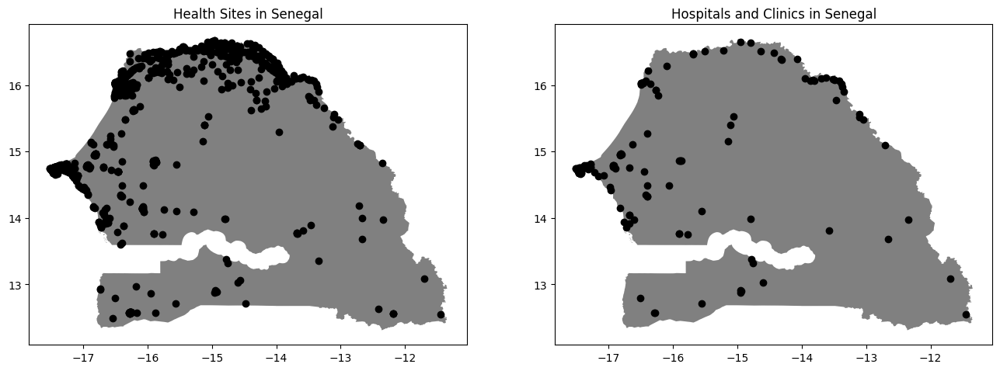

In [14]:
fig, axs = plt.subplots(ncols=2, figsize=(16, 9))
boundary.plot(ax=axs[0], color='gray')
boundary.plot(ax=axs[1], color='gray')
gdf.plot(ax=axs[0], color='black')
hosps.plot(ax=axs[1], color='black')

axs[0].set_title('Health Sites in Senegal')
axs[1].set_title('Hospitals and Clinics in Senegal')
plt.show()


In [15]:
vor = gcVoronoi(hosps.geometry.to_list())
uncon = vor.unconstrained_polygons
uncon_gS = vor.to_geoSeries(constrained=False)
vor.geo_constrain(boundary.geometry[0])
con = vor.constrained_polygons
con_gS = vor.to_geoSeries(constrained=True)

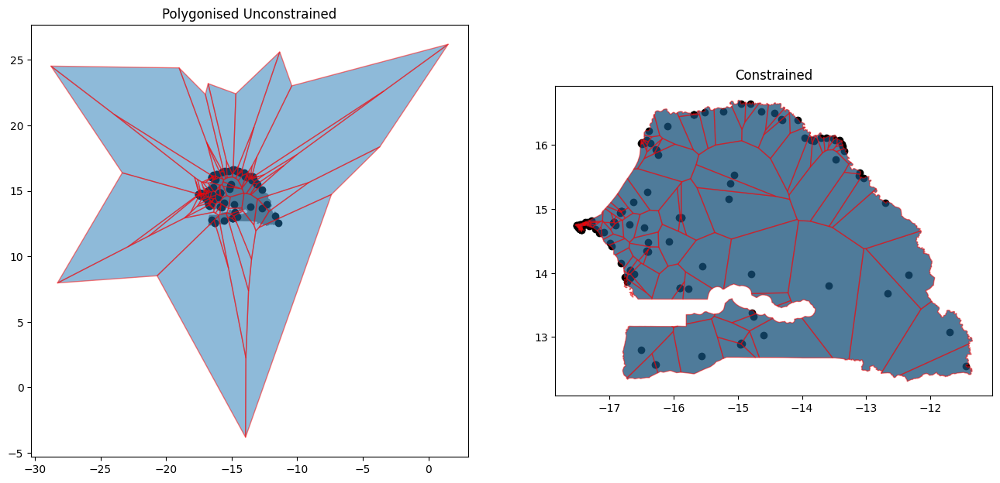

In [16]:
fig2, axs2 = plt.subplots(ncols=2, figsize=(16,9))
boundary.plot(ax=axs2[0], color='gray')
boundary.plot(ax=axs2[1], color='gray')
hosps.plot(ax=axs2[0], color='black')
hosps.plot(ax=axs2[1], color='black')
uncon_gS.plot(ax=axs2[0], alpha=0.5, edgecolor='red')
con_gS.plot(ax=axs2[1], alpha=0.5, edgecolor='red')

axs2[0].set_title('Polygonised Unconstrained')
axs2[1].set_title('Constrained')

plt.show()

## Interfacing with WorldPop

In [17]:
#reading WorldPop and adding empty geometry
pop_df = pd.read_csv(os.path.join('Senegal pop', 'ppp_SEN_2020_1km_Aggregated_UNadj.csv'))
print(len(pop_df))
pop_df['geometry'] = geometry.Point()
pop_df.head()

237052


,X,Y,Z,geometry
0,-14.988750,16.695417,40.697403,POINT EMPTY
1,-14.980417,16.695417,44.591194,POINT EMPTY
2,-14.997083,16.687083,92.928772,POINT EMPTY
3,-14.988750,16.687083,205.590958,POINT EMPTY
4,-14.980417,16.687083,236.227814,POINT EMPTY


In [18]:
#making shapely.geometry.Point from each entry
for i in pop_df.index:
    pop_df.loc[i, 'geometry'] = geometry.Point(pop_df.loc[i, 'X'], pop_df.loc[i, 'Y'])
    print(i, end='\r')
pop_df.head()

,X,Y,Z,geometry
0,-14.988750,16.695417,40.697403,POINT (-14.988749941999991 16.695416802041258)
1,-14.980417,16.695417,44.591194,POINT (-14.980416608699992 16.695416802041258)
2,-14.997083,16.687083,92.928772,POINT (-14.997083275299993 16.68708346874126)
3,-14.988750,16.687083,205.590958,POINT (-14.988749941999991 16.68708346874126)
4,-14.980417,16.687083,236.227814,POINT (-14.980416608699992 16.68708346874126)


In [19]:
pop_gdf = gpd.GeoDataFrame(pop_df[['geometry', 'Z']], geometry='geometry')

In [20]:
# fig3, ax3 = plt.subplots(figsize=(16, 9))
# pop_gdf.plot(ax=ax3, column='Z')
# plt.show()

In [21]:
pop_list = np.zeros(len(con))
for i in pop_gdf.index:
    print('point: ', i, end='\r')
    for j in range(len(con)):
        if pop_gdf.loc[i, 'geometry'].within(con[j]):
            pop_list[j] += pop_gdf.loc[i, 'Z']
            break

In [22]:
pop_list

array([340426.99080014,  76221.52035522, 142873.77469365, 171548.8775444 ,
        51115.59570312, 134127.35102081,  29751.69726562,  28606.04003906,
       201989.34866333,  25860.13867188,  69703.28515625,  21047.15039062,
        67671.70247078,  36265.31835938,  19355.51953125,  43423.57778358,
        11325.07128906,  56721.2421875 , 139948.66137695,  14313.57128906,
       102272.21289062,  29782.59814453, 103631.71119058,  71284.28647614,
        16066.16113281,  32152.96417236,  29007.30300522, 280669.74795115,
       130165.27153683,  28240.23242188,  46032.640625  ,      0.        ,
            0.        , 132109.01367188,  85576.99023438,  65388.6484375 ,
        19993.37636948,  58855.45800781,  55876.19335938,  27908.9296875 ,
            0.        ,      0.        ,      0.        ,      0.        ,
        18487.3984375 ,  27650.52929688,  14575.80957031,  14143.4765625 ,
        12644.00097656, 166917.19702148,  17261.4921875 , 164204.44981384,
       124530.8197372 ,  

In [23]:
con_gDF = gpd.GeoDataFrame(data={
    'geometry': con_gS,
    'pop': pop_list
}, geometry='geometry')
con_gDF.head()

,geometry,pop
0,"POLYGON ((-15.60630 15.84322, -15.64741 15.687...",340426.990800
1,"POLYGON ((-17.13125 14.71459, -17.11005 14.549...",76221.520355
2,"POLYGON ((-16.33521 12.74206, -16.24434 12.440...",142873.774694
3,"POLYGON ((-16.97081 14.93396, -16.92857 14.786...",171548.877544
4,"POLYGON ((-17.49869 14.73939, -17.49057 14.742...",51115.595703


In [24]:
hosps['pop'] = pop_list
hosps.head()

,osm_id,amenity,healthcare,name,operator,source,speciality,operator_t,contact_nu,operationa,...,electricit,is_in_heal,url,addr_house,addr_stree,addr_postc,addr_city,changeset_,geometry,pop
0,11919651408,hospital,hospital,Centre de Santé,None,None,None,None,None,None,...,None,None,None,None,None,None,None,Mapinator_2000x,POINT (-16.23491 15.84216),340426.990800
50,2265107636,clinic,None,Poste de Santé de Nianghal,None,None,None,None,None,None,...,None,None,None,None,None,None,Nianghal,Jean-Marc Liotier,POINT (-17.16070 14.62778),76221.520355
58,2281106113,clinic,clinic,Clinique Paramédicale Saint-Antoine de Padoue,None,None,None,None,None,None,...,None,None,None,None,None,None,None,WalkerB,POINT (-16.28823 12.56632),142873.774694
74,2463711418,clinic,None,Hôpital des Élèves,None,None,None,None,None,None,...,None,None,None,None,None,None,None,Jean-Marc Liotier,POINT (-16.93436 14.79378),171548.877544
84,2618352537,clinic,clinic,Clinique des Mamelles,None,survey,None,None,None,None,...,None,None,None,None,None,None,None,WalkerB,POINT (-17.50276 14.72730),51115.595703


In [25]:
con_gDF.to_file(os.path.join('results', 'cells_w_population', 'senegal_polys_w_pop.shp'))
hosps.to_file(os.path.join('results', 'hosps_w_population', 'senegal_points_w_pop.shp'))

## Mapping

In [26]:
# con_gDF = gpd.read_file(os.path.join('results', 'polys_w_pop.shp'))
# hosps = gpd.read_file(os.path.join('results', 'points_w_pop.shp'))

In [27]:
boundary.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [28]:
con_gDF.set_crs(boundary.crs)
hosps.set_crs(boundary.crs)
hosps.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [128]:
# legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='w', marker='P', markerfacecolor='green', markersize=15, label='Healthsite with confirmed emergency room'),
    Line2D([0], [0], color='w', marker='P', markerfacecolor='black', markersize=15, label='Healthsite with no confirmed emergency room')
]

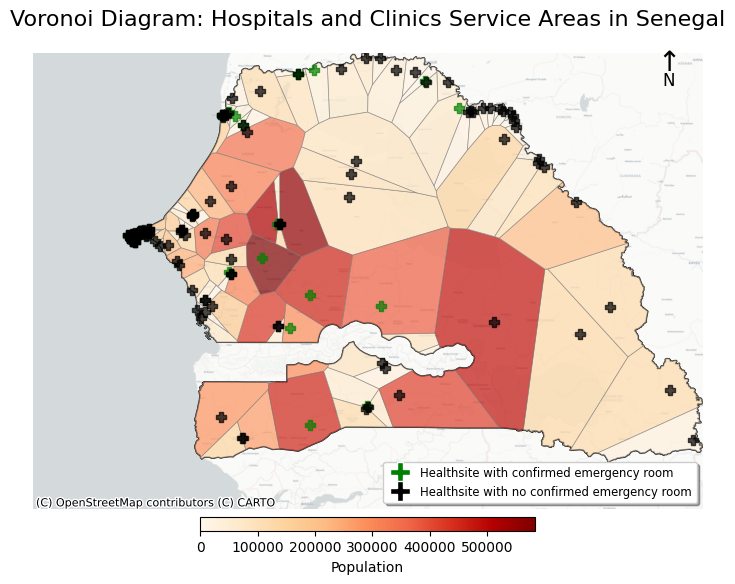

In [187]:
fig4, ax4 = plt.subplots(figsize=(7, 9), dpi=100)


boundary.plot(ax=ax4, color='none')


con_gDF.plot(ax=ax4, column='pop', cmap='OrRd', legend=True, 
             legend_kwds={'label': 'Population',
                          'orientation': 'horizontal',
                          'shrink': 0.5,
                          'aspect': 25,
                          'pad': 0.01,
                          'fraction': 0.1},
             edgecolor='grey', linewidth=0.5, alpha=0.7)

hosps[hosps['emergency'] == 'yes'].plot(ax=ax4, color='green', marker='P', markersize=50, alpha=0.7)
hosps[hosps['emergency'] != 'yes'].plot(ax=ax4, color='black', marker='P', markersize=50, alpha=0.7)

ax4.set_xlim(left=senegal_bbox[0]-0.5, right=senegal_bbox[2]-0.5)
ax4.set_ylim(bottom=senegal_bbox[1], top=senegal_bbox[3]-0.5)


ax4.set_title('Voronoi Diagram: Hospitals and Clinics Service Areas in Senegal', fontsize=16, pad=20)
ax4.set_axis_off()


cx.add_basemap(ax4, crs=hosps.crs, source=cx.providers.CartoDB.Positron, zoom=9)

ax4.annotate('N', xy=(0.95, 0.94), xycoords='axes fraction', fontsize=12, ha='center', va='center')
ax4.annotate('↑', xy=(0.95, 0.98), xycoords='axes fraction', fontsize=20, ha='center', va='center')

ax4.legend(handles=legend_elements, loc='lower right', shadow=True, fontsize='small')

plt.tight_layout()
plt.show()

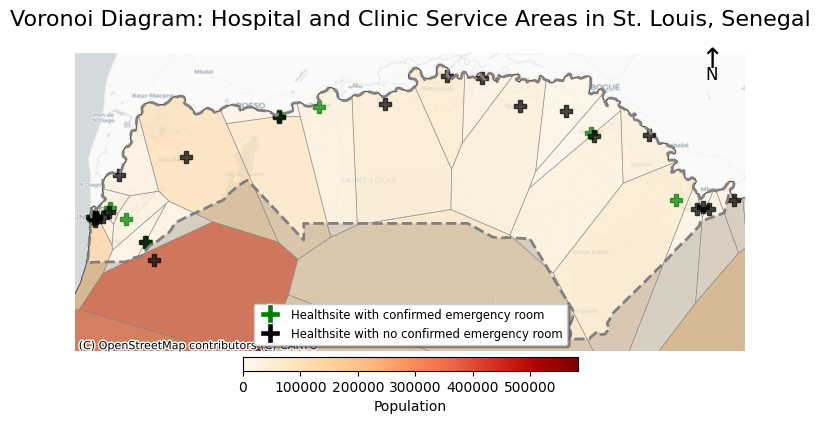

In [197]:
fig5, ax5 = plt.subplots(figsize=(7, 7), dpi=100)

boundary.plot(ax=ax5, color='none')
subnat_boundary.loc[subnat_boundary['ADM1_FR']!='Saint-Louis'].plot(ax=ax5, color='grey', edgecolor=None, alpha=1, linewidth=1.5)


con_gDF.plot(ax=ax5, column='pop', cmap='OrRd', legend=True, 
             legend_kwds={'label': 'Population',
                        #   'location': 'top', 
                          'orientation': 'horizontal',
                          'shrink': 0.5,
                          'aspect': 25,
                          'pad': 0.01,
                          'fraction': 0.1},
             edgecolor='grey', linewidth=0.5, alpha=0.7)

hosps[hosps['emergency'] == 'yes'].plot(ax=ax5, color='green', marker='P', markersize=80, alpha=0.7)
hosps[hosps['emergency'] != 'yes'].plot(ax=ax5, color='black', marker='P', markersize=80, alpha=0.7)


subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Saint-Louis'].plot(ax=ax5, color='none', edgecolor='grey', linestyle='dashed', alpha=1, linewidth=2)

ax5.set_title('Voronoi Diagram: Hospital and Clinic Service Areas in St. Louis, Senegal', fontsize=16, pad=20)
ax5.set_axis_off()

ax5.set_xlim(left=stlouis_bbox[0], right=stlouis_bbox[2])
ax5.set_ylim(bottom=stlouis_bbox[1], top=stlouis_bbox[3])

cx.add_basemap(ax5, crs=hosps.crs, source=cx.providers.CartoDB.Positron, zoom=9)

ax5.annotate('N', xy=(0.95, 0.93), xycoords='axes fraction', fontsize=12, ha='center', va='center')
ax5.annotate('↑', xy=(0.95, 0.98), xycoords='axes fraction', fontsize=20, ha='center', va='center')
ax5.legend(handles=legend_elements, loc='lower center', shadow=True, fontsize='small')


plt.tight_layout()
plt.show()

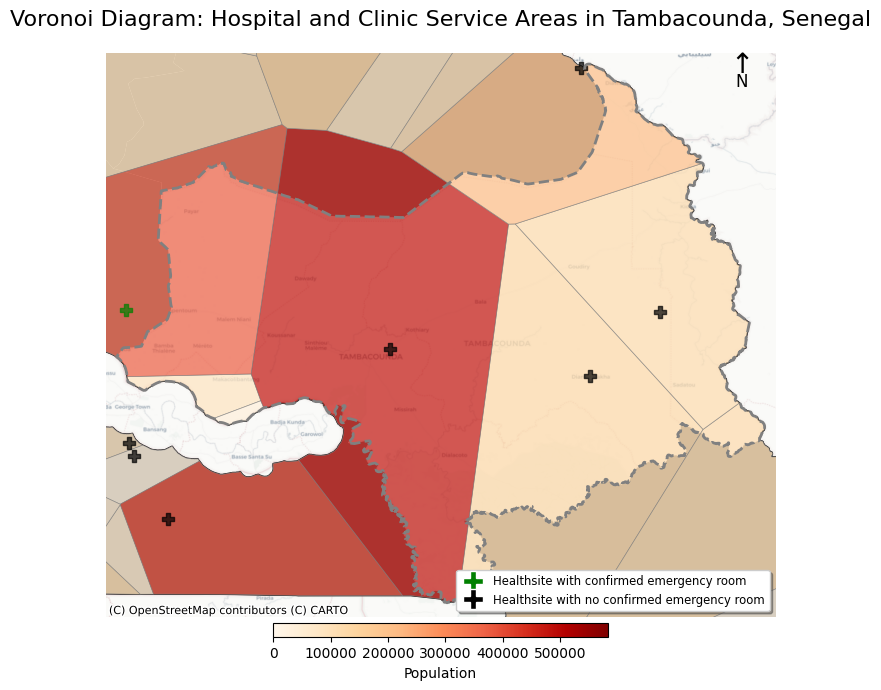

In [201]:
fig6, ax6 = plt.subplots(figsize=(7, 7), dpi=100)

boundary.plot(ax=ax6, color='none')
subnat_boundary.loc[subnat_boundary['ADM1_FR']!='Tambacounda'].plot(ax=ax6, color='grey', edgecolor=None, alpha=1, linewidth=1.5)


con_gDF.plot(ax=ax6, column='pop', cmap='OrRd', legend=True, 
             legend_kwds={'label': 'Population',
                        #   'location': 'top', 
                          'orientation': 'horizontal',
                          'shrink': 0.5,
                          'aspect': 25,
                          'pad': 0.01,
                          'fraction': 0.1},
             edgecolor='grey', linewidth=0.5, alpha=0.7)

hosps[hosps['emergency'] == 'yes'].plot(ax=ax6, color='green', marker='P', markersize=80, alpha=0.7)
hosps[hosps['emergency'] != 'yes'].plot(ax=ax6, color='black', marker='P', markersize=80, alpha=0.7)


subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Tambacounda'].plot(ax=ax6, color='none', edgecolor='grey', linestyle='dashed', alpha=1, linewidth=2)

ax6.set_title('Voronoi Diagram: Hospital and Clinic Service Areas in Tambacounda, Senegal', fontsize=16, pad=20)
ax6.set_axis_off()

ax6.set_xlim(left=tamba_bbox[0], right=tamba_bbox[2])
ax6.set_ylim(bottom=tamba_bbox[1], top=tamba_bbox[3])

cx.add_basemap(ax6, crs=hosps.crs, source=cx.providers.CartoDB.Positron, zoom=9)

ax6.annotate('N', xy=(0.95, 0.95), xycoords='axes fraction', fontsize=12, ha='center', va='center')
ax6.annotate('↑', xy=(0.95, 0.98), xycoords='axes fraction', fontsize=20, ha='center', va='center')
ax6.legend(handles=legend_elements, loc='lower right', shadow=True, fontsize='small')


plt.tight_layout()
plt.show()

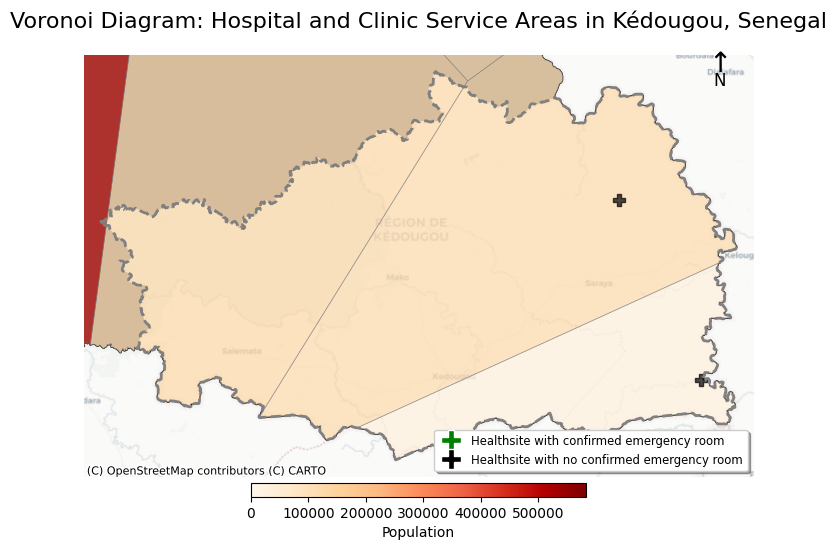

In [203]:
fig7, ax7 = plt.subplots(figsize=(7, 7), ncols=1)

boundary.plot(ax=ax7, color='none')
subnat_boundary.loc[subnat_boundary['ADM1_FR']!='Kédougou'].plot(ax=ax7, color='grey', edgecolor=None, alpha=1, linewidth=1.5)


con_gDF.plot(ax=ax7, column='pop', cmap='OrRd', legend=True, 
             legend_kwds={'label': 'Population',
                        #   'location': 'top', 
                          'orientation': 'horizontal',
                          'shrink': 0.5,
                          'aspect': 25,
                          'pad': 0.01,
                          'fraction': 0.1},
             edgecolor='grey', linewidth=0.5, alpha=0.7)

hosps[hosps['emergency'] == 'yes'].plot(ax=ax7, color='green', marker='P', markersize=80, alpha=0.7)
hosps[hosps['emergency'] != 'yes'].plot(ax=ax7, color='black', marker='P', markersize=80, alpha=0.7)


subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Kédougou'].plot(ax=ax7, color='none', edgecolor='grey', linestyle='dashed', alpha=1, linewidth=2)

ax7.set_title('Voronoi Diagram: Hospital and Clinic Service Areas in Kédougou, Senegal', fontsize=16, pad=20)
ax7.set_axis_off()

ax7.set_xlim(left=kedougou_bbox[0], right=kedougou_bbox[2])
ax7.set_ylim(bottom=kedougou_bbox[1], top=kedougou_bbox[3])

cx.add_basemap(ax7, crs=hosps.crs, source=cx.providers.CartoDB.Positron, zoom=9)

ax7.annotate('N', xy=(0.95, 0.94), xycoords='axes fraction', fontsize=12, ha='center', va='center')
ax7.annotate('↑', xy=(0.95, 0.98), xycoords='axes fraction', fontsize=20, ha='center', va='center')
# cx.add_scalebar(ax7, location='lower left')
ax7.legend(handles=legend_elements, loc='lower right', shadow=True, fontsize='small')


plt.tight_layout()
plt.show()

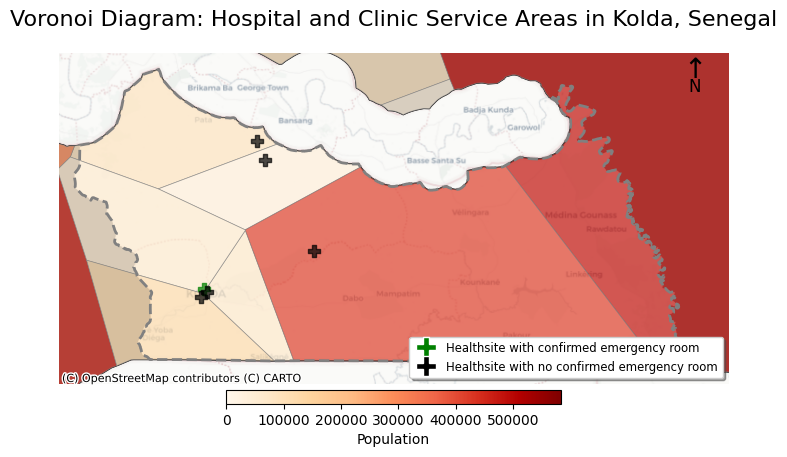

In [205]:
fig8, ax8 = plt.subplots(figsize=(7, 7), ncols=1)

boundary.plot(ax=ax8, color='none')
subnat_boundary.loc[subnat_boundary['ADM1_FR']!='Kolda'].plot(ax=ax8, color='grey', edgecolor=None, alpha=1, linewidth=1.5)


con_gDF.plot(ax=ax8, column='pop', cmap='OrRd', legend=True, 
             legend_kwds={'label': 'Population',
                        #   'location': 'top', 
                          'orientation': 'horizontal',
                          'shrink': 0.5,
                          'aspect': 25,
                          'pad': 0.01,
                          'fraction': 0.1},
             edgecolor='grey', linewidth=0.5, alpha=0.7)

hosps[hosps['emergency'] == 'yes'].plot(ax=ax8, color='green', marker='P', markersize=80, alpha=0.7)
hosps[hosps['emergency'] != 'yes'].plot(ax=ax8, color='black', marker='P', markersize=80, alpha=0.7)


subnat_boundary.loc[subnat_boundary['ADM1_FR']=='Kolda'].plot(ax=ax8, color='none', edgecolor='grey', linestyle='dashed', alpha=1, linewidth=2)

ax8.set_title('Voronoi Diagram: Hospital and Clinic Service Areas in Kolda, Senegal', fontsize=16, pad=20)
ax8.set_axis_off()

ax8.set_xlim(left=kolda_bbox[0], right=kolda_bbox[2])
ax8.set_ylim(bottom=kolda_bbox[1], top=kolda_bbox[3])

cx.add_basemap(ax8, crs=hosps.crs, source=cx.providers.CartoDB.Positron, zoom=9)

ax8.annotate('N', xy=(0.95, 0.90), xycoords='axes fraction', fontsize=12, ha='center', va='center')
ax8.annotate('↑', xy=(0.95, 0.95), xycoords='axes fraction', fontsize=20, ha='center', va='center')
# cx.add_scalebar(ax8, location='lower left')
ax8.legend(handles=legend_elements, loc='lower right', shadow=True, fontsize='small')


plt.tight_layout()
plt.show()

In [96]:
# m = boundary.explore(
#     fillColor='none',
#     # color='k',
#     tooltip=False,
#     popup = False,
#     name='border',
#     # height='50%',
#     # width='50%'
# )

# con_gDF.explore(
#     m=m,
#     column='pop',
#     legend=True,
#     cmap='OrRd',
#     legend_kwds={'caption': 'pop', 'max_labels': 5},
#     color='black',
#     tooltip='pop'
# )

# hosps.explore(
#     m=m,
#     tooltip=['osm_id', 'name', 'addr_city'],
#     color='black',
#     marker_kwds=dict(radius=6, fill=True),
# )

# m

In [98]:
import folium
import folium.plugins as plugins

In [99]:
# import geopandas as gpd
# import folium

# Create the base map
m = boundary.explore(
    fillColor='none',
    # color='k',
    tooltip=False,
    popup = False,
    name='border',
    # height='50%',
    # width='50%'
)

con_gDF.explore(
    m=m,
    column='pop',
    # scheme='quantiles',
    cmap='OrRd',
    legend=True,
    legend_kwds={
        'label': 'Population',
        'orientation': 'horizontal'
    },
    tooltip=['pop'],
    popup=True,
    # tiles='CartoDB positron',
    name='Population'
)

# Add boundary
boundary.explore(m=m, color='none', name='Boundary')

# # Add hospitals
hosps[hosps['emergency'] == 'yes'].explore(
    m=m,
    color='green',
    # marker_type='circle',
    # radius=5,
    tooltip=['name', 'emergency'],
    name='Hospitals with Emergency'
)

hosps[hosps['emergency'] != 'yes'].explore(
    m=m,
    color='red',
    # marker_type='circle',
    # radius=5,
    tooltip=['name', 'emergency'],
    name='Hospitals without Emergency'
)

# Add title
title_html = '''
             <h3 align="center" style="font-size:16px">
             <b>Voronoi Diagram: Hospital and Clinic Service Areas in Senegal</b>
             </h3>
             '''
m.get_root().html.add_child(folium.Element(title_html))

# # Add Layer Control
folium.LayerControl().add_to(m)

# # Add Scale
plugins.MeasureControl(position='bottomleft').add_to(m)

# # Add Fullscreen option
plugins.Fullscreen().add_to(m)

# m.get_root().html.add_child(folium.Element(north_arrow))

# Display the map
m

In [22]:
m.save(os.path.join('results', 'sen_hosps.html'))